Imports

In [1]:
import pandas as pd
import numpy as np
import os
from transformers import AutoModelForImageClassification, ViTImageProcessor, Trainer
from transformers import ViTForImageClassification
from datasets import load_dataset, Dataset, load_from_disk
from sklearn.metrics import accuracy_score, classification_report, det_curve
from sklearn.model_selection import train_test_split
import torch.nn.functional as F
import torch
import math
import operator
from pathlib import Path
from matplotlib.backends.backend_pdf import PdfPages
from src.DET import DET
from tqdm import tqdm
from ipywidgets import fixed, interact
import ipywidgets as widgets
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy.stats import describe, gaussian_kde
import random
from PIL import Image
import src.DET
#from src.auxiliary_utils import Auxiliary
import cv2 

hugging_dataset = './hugging_face_dataset'
model_path = './out/VIT-21k'
model_name = 'right_eyes_only'
checkpoint = 'Run_0/model-saved'

info_path= "./GFI_database_with_labels/info/"
right_eye_path = "./GFI_database_with_labels/Right_eye/"
left_eye_path = "./GFI_database_with_labels/Left_eye/"

d:\Documents\biometric-systems\delivery\src\DET.py:532: SyntaxWarning: invalid escape sequence '\%'
  mpl.xlabel(mpl.axes().get_xlabel().replace('%', '\%'))
d:\Documents\biometric-systems\delivery\src\DET.py:533: SyntaxWarning: invalid escape sequence '\%'
  mpl.ylabel(mpl.axes().get_ylabel().replace('%', '\%'))


In [2]:
right_eye = np.loadtxt(f'{info_path}List_Right_eye.txt', dtype=str)
right_eye = pd.DataFrame(right_eye, columns=['filename', 'gender'])
right_eye['gender'] = pd.to_numeric(right_eye['gender'])
left_eye = np.loadtxt(f'{info_path}List_Left_eye.txt', dtype=str)
left_eye = pd.DataFrame(left_eye, columns=['filename','gender'])
left_eye['gender'] = pd.to_numeric(left_eye['gender'])

print(right_eye['filename'].head())
print(left_eye['filename'].head())

right_eye

0    05485d154.tiff
1      05647d3.tiff
2    05512d102.tiff
3    05484d132.tiff
4    05248d493.tiff
Name: filename, dtype: object
0    05485d155.tiff
1      05647d4.tiff
2    05512d103.tiff
3    05484d133.tiff
4    05248d494.tiff
Name: filename, dtype: object


,filename,gender
0,05485d154.tiff,1
1,05647d3.tiff,1
2,05512d102.tiff,1
3,05484d132.tiff,1
4,05248d493.tiff,1
...,...,...
1495,05663d307.tiff,0
1496,05728d85.tiff,0
1497,05306d479.tiff,0
1498,05305d393.tiff,0


In [ ]:
print("Right vs left size:", right_eye.shape, left_eye.shape)
print("Number of men in right eye:", right_eye[right_eye['gender']==0].shape[0])
print("Number of men in left eye:", left_eye[left_eye['gender']==0].shape[0])

# Get the first 4 images returned by head for women and men
women_example_right = [f'{right_eye_path}{filename}' for filename in right_eye[right_eye['gender']==1]['filename'].head(4)]
women_example_left = [f'{left_eye_path}{filename}' for filename in left_eye[left_eye['gender']==1]['filename'].head(4)]

men_example_right = [f'{right_eye_path}{filename}' for filename in (right_eye[right_eye['gender']==0]['filename']).sort_values().head(4)]
men_example_left = [f'{left_eye_path}{filename}' for filename in (left_eye[left_eye['gender']==0]['filename']).sort_values().head(4)]

women_example = [item for pair in zip(women_example_right, women_example_left) for item in pair]
men_example = [item for pair in zip(men_example_right, men_example_left) for item in pair]

Right vs left size: (1500, 2) (1500, 2)
Number of men in right eye: 750
Number of men in left eye: 750


In [ ]:

# Visualize left and right image
columns = 2
rows = 1

_, axs = plt.subplots(rows,columns)
img = plt.imread(women_example[0])
axs[0].imshow(img, cmap='gray')
axs[0].axis("off")
img = plt.imread(men_example[0])
axs[1].imshow(img, cmap='gray')
axs[1].axis("off")

plt.savefig("eyes.png")


NameError: name 'plt' is not defined

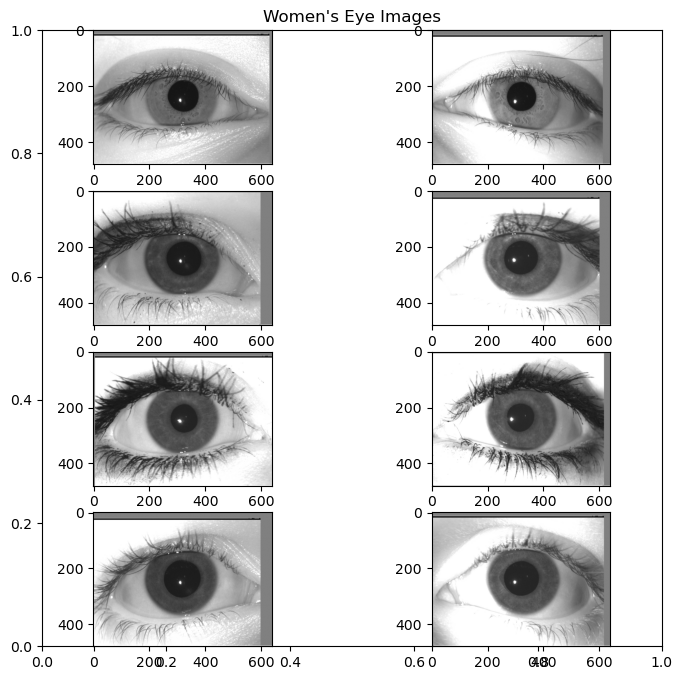

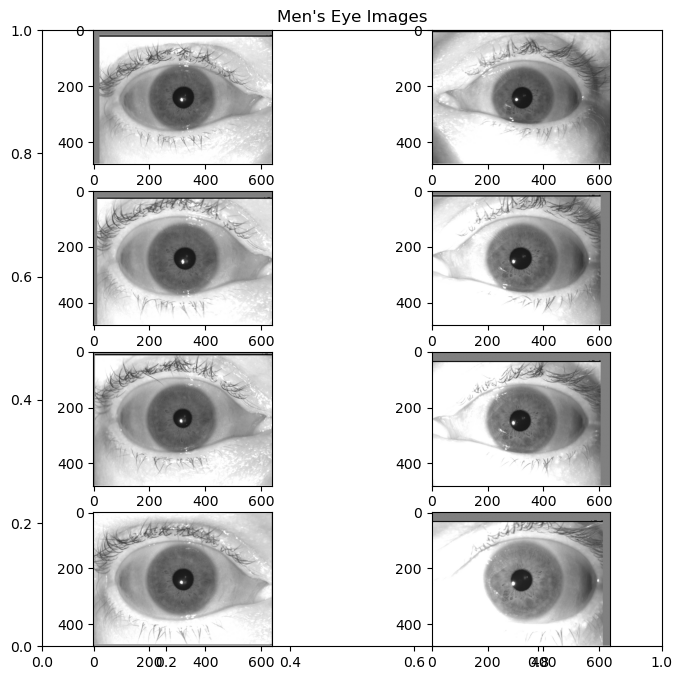

(480, 640)


In [4]:

# Visualize left and right image
w = 10
h = 10
fig = plt.figure(figsize=(8, 8))
plt.title('Women\'s Eye Images')
columns = 2
rows = 4
for i in range(1, columns*rows +1):
    img = plt.imread(women_example[i-1])
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')
plt.show()

fig = plt.figure(figsize=(8, 8))
plt.title('Men\'s Eye Images')
columns = 2
rows = 4
for i in range(1, columns*rows +1):
    img = plt.imread(men_example[i-1])
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')
plt.show()

print(img.shape)

The images used contain eyelashes and more information than just the iris. One could consider cropping to only the eyes, but it is also interesting to see how the eye lashes affect the results. Most likely it will help the model identify women, as it is more common for women to have longer/darker eyelashes and wear make up.

This however can be deceiving and lead to some false positives.

Loading all images  - just use right eye for now

1500it [00:45, 32.99it/s]
1500it [00:58, 25.71it/s]


X shape: (1500, 480, 640) and (1500, 480, 640) 
Y Shape: (1500,) and (1500,)
0.0    750
1.0    750
Name: count, dtype: int64
0.0    750
1.0    750
Name: count, dtype: int64


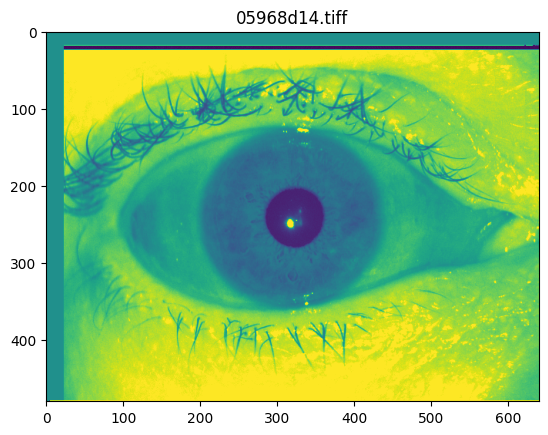

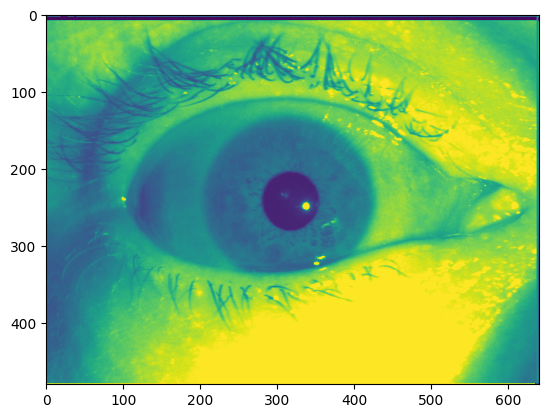

In [4]:
import glob, os
from pandas import Series
def get_image_paths(directory):
    return glob.glob(f"{directory}*.tiff")

right_eye_X = np.zeros(shape=(1500, 480, 640))
right_eye_y = np.zeros(shape=(1500))

for index, image_path in tqdm(enumerate(get_image_paths(right_eye_path))):
    right_eye_X[index] = plt.imread(image_path)
    filename = os.path.basename(image_path)
    label = right_eye.loc[right_eye['filename'] == filename, "gender"]
    right_eye_y[index] = label.values[0]

left_eye_X = np.zeros(shape=(1500, 480, 640))
left_eye_y = np.zeros(shape=(1500))
for index, image_path in tqdm(enumerate(get_image_paths(left_eye_path))):
    image = plt.imread(image_path)
    mirrored_image = image[:, ::-1]
    left_eye_X[index] = mirrored_image
    filename = os.path.basename(image_path)
    label = left_eye.loc[left_eye['filename'] == filename, "gender"]
    left_eye_y[index] = label.values[0]

print(f"X shape: {right_eye_X.shape} and {left_eye_X.shape} ")
print(f"Y Shape: {right_eye_y.shape} and {left_eye_y.shape}")
right_eye_y_s = Series(right_eye_y)
left_eye_y_s = Series(left_eye_y)
print(right_eye_y_s.value_counts())
print(left_eye_y_s.value_counts())
plt.title(filename)
plt.imshow(right_eye_X[0])
plt.show()
plt.imshow(left_eye_X[0])

Data splitting - 80 % - 20 %

In [ ]:
from sklearn.model_selection import train_test_split

#total_x =np.concatenate([right_eye_X, left_eye_X])
#total_y = np.concatenate([right_eye_y, left_eye_y])

# Determine the number of samples for each split
X_train, X_test, y_train, y_test = train_test_split(total_x, total_y, test_size=0.20, random_state=42)  
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")

print(f"y_test shape: {y_test.shape}")

X_train shape: (2400, 480, 640)
X_test shape: (600, 480, 640)
y_train shape: (2400,)
y_test shape: (600,)


In [ ]:

total_x =np.concatenate([right_eye_X, left_eye_X])
total_y =np.concatenate([right_eye_y, left_eye_y])


In [33]:
total_x

array([[[126.,  12., 147., ..., 254., 254., 254.],
        [127., 127., 127., ..., 127., 127., 127.],
        [127., 127., 127., ..., 127., 127., 127.],
        ...,
        [178., 127., 127., ..., 173., 178., 176.],
        [173., 127., 127., ..., 173., 177., 178.],
        [  2., 102., 149., ..., 254., 254., 254.]],

       [[126.,  12., 152., ..., 254., 254., 254.],
        [127., 127., 127., ..., 127., 127., 127.],
        [127., 127., 127., ..., 127., 127., 127.],
        ...,
        [211., 127., 127., ..., 214., 218., 212.],
        [212., 127., 127., ..., 208., 212., 215.],
        [  2., 100., 190., ..., 254., 254., 254.]],

       [[126.,  12., 146., ..., 254., 254., 254.],
        [127., 127., 127., ..., 127., 127., 127.],
        [127., 127., 127., ..., 127., 127., 127.],
        ...,
        [185., 127., 127., ..., 181., 181., 183.],
        [186., 127., 127., ..., 183., 182., 180.],
        [  2.,  75., 201., ..., 254., 254., 254.]],

       ...,

       [[126.,  12.,  52

Copy them to new folder

In [5]:
def clear_image_folder(folder_path):
    # Pattern: all files with given extensions in the folder
    for file_path in glob.glob(f"{folder_path}/*.tiff"):
        print(file_path)
        if os.path.isfile(file_path):
            os.remove(file_path)

#clear_image_folder(f'{hugging_dataset}/train/male/')
#clear_image_folder(f'{hugging_dataset}/train/female/')
#clear_image_folder(f'{hugging_dataset}/test/male/')
#clear_image_folder(f'{hugging_dataset}/test/female/')


In [ ]:
path = "./both-mirrored-eyes"
if os.listdir(f'{path}/train/male/'):
    print("Directory already filled with images")
    raise SystemExit("Stopping this cell")

i = 0
for image, label in zip(X_train, y_train):
    if label == 0:
        plt.imsave(f'{path}/train/male/M_{i}.tiff', image)
    else:
        plt.imsave(f'{path}/train/female/F_{i}.tiff', image)
    i += 1

for image, label in zip(X_test, y_test):
    if label == 0:
        plt.imsave(f'{path}/test/male/M_{i}.tiff', image)
    else:
        plt.imsave(f'{path}/test/female/F_{i}.tiff', image)
    i += 1

In [ ]:
def count_files_in_dirs(root_dir):
    for dirpath, dirnames, filenames in os.walk(root_dir):
        num_files = len([f for f in filenames if not f.startswith('.')])  # skip hidden files
        print(f"{dirpath}: {num_files} files")
    print("Total files:", sum(len(files) for _, _, files in os.walk(root_dir)))

count_files_in_dirs(f'./{path}/train')
count_files_in_dirs(f'./{path}/test')


././both-eyes/train: 0 files
././both-eyes/train\female: 1188 files
././both-eyes/train\male: 1212 files
Total files: 2400
././both-eyes/test: 0 files
././both-eyes/test\female: 312 files
././both-eyes/test\male: 288 files
Total files: 600


# Dataset load

In [19]:
from datasets import load_dataset
path = "./both-eyes"
dataset = load_dataset('imagefolder', data_dir=path)
dataset

Resolving data files:   0%|          | 0/2400 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/600 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 2400
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 600
    })
})

In [20]:
dataset.save_to_disk(f"./datasets/both_eyes")


Saving the dataset (0/6 shards):   0%|          | 0/2400 [00:00<?, ? examples/s]

Saving the dataset (0/2 shards):   0%|          | 0/600 [00:00<?, ? examples/s]

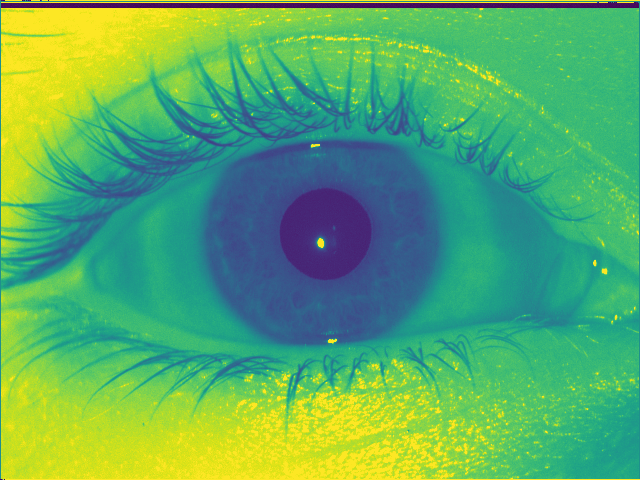

In [23]:
from datasets import load_from_disk

dataset = load_from_disk("./datasets/both_eyes")
dataset["train"][0]["image"]

In [9]:
labels = dataset['train'].features['label'].names
print(labels)
dataset["train"]


['female', 'male']


Dataset({
    features: ['image', 'label'],
    num_rows: 1200
})

Model import

In [25]:
from transformers import ViTImageProcessor
import torch

def process_image(example):
    #Convert image to 3d from grayscale
    img = example["image"].convert("RGB")
    inputs = processor(img, return_tensors='pt')
    inputs["pixel_values"] = inputs["pixel_values"].squeeze(0)  # Remove the batch dimension
    inputs['labels'] = example["label"]
    return inputs

model_name_or_path = 'google/vit-base-patch16-224-in21k'
processor = ViTImageProcessor.from_pretrained(model_name_or_path)
processor

ViTImageProcessor {
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [26]:
process_image(dataset["train"][0]).get('pixel_values').shape

torch.Size([3, 224, 224])

# Preprocess dataset

In [27]:
dataset_processed = dataset.map(process_image)
print(dataset_processed["train"])
dataset_processed.set_format(type="torch", columns=["pixel_values", "labels"]) # .map removes tensors so put them back

dataset_processed["train"][0:2].get('pixel_values').shape

Map:   0%|          | 0/2400 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'label', 'pixel_values', 'labels'],
    num_rows: 2400
})


torch.Size([2, 3, 224, 224])

In [28]:
dataset_processed.save_to_disk(f"./processed_datasets/both_eyes")


Saving the dataset (0/9 shards):   0%|          | 0/2400 [00:00<?, ? examples/s]

Saving the dataset (0/3 shards):   0%|          | 0/600 [00:00<?, ? examples/s]

Training and Evaluation

In [32]:
from evaluate import load

metric = load("accuracy")
def compute_metrics(p):
    return metric.compute(predictions=np.argmax(p.predictions, axis=1), references=p.label_ids)

def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['labels'] for x in batch])
    }

In [34]:
model = ViTForImageClassification.from_pretrained(
    model_name_or_path,
    num_labels=2,
    #id2label={str(i): label for i, label in enumerate(labels)},
    #label2id={label: str(i) for i, label in enumerate(labels)},
)
model

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (intermed

In [ ]:
from transformers import TrainingArguments

training_args = TrainingArguments(
  output_dir="./google/vit-base-patch16-224-in21k",
  per_device_train_batch_size=16,
  eval_strategy="steps",
  num_train_epochs=3,
  fp16=True,
  save_steps=100,
  eval_steps=100,
  logging_steps=10,
  learning_rate=2e-4,
  save_total_limit=2,
  #remove_unused_columns=False, removed for now
  push_to_hub=False,
  report_to='tensorboard',
  load_best_model_at_end=True,
)

In [39]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn, 
    compute_metrics=compute_metrics,
    train_dataset=dataset_processed["train"],
    eval_dataset=dataset_processed["test"],
    tokenizer=processor,
)
model.train()

C:\Users\tomho\AppData\Local\Temp\ipykernel_25240\2844692665.py:3: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (intermed

In [ ]:
train_results = trainer.train()
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)

d:\conda\envs\biometric\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Step,Training Loss,Validation Loss


***** train metrics *****
  epoch                    =        1.0
  total_flos               = 86604047GF
  train_loss               =     0.5492
  train_runtime            = 0:09:53.32
  train_samples_per_second =      2.022
  train_steps_per_second   =      0.126


In [41]:
metrics = trainer.evaluate(dataset_processed['test'])
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

d:\conda\envs\biometric\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


***** eval metrics *****
  epoch                   =        1.0
  eval_accuracy           =     0.8433
  eval_loss               =     0.3758
  eval_runtime            = 0:01:03.40
  eval_samples_per_second =      4.732
  eval_steps_per_second   =      0.599


In [14]:
trainer.save_model(f"{hugging_dataset}/model1")

Inference on one image

In [6]:
model = AutoModelForImageClassification.from_pretrained(f"{model_path}/{model_name}/{checkpoint}/")

In [11]:
%%time 
index = random.randint(0, len(dataset_processed["train"]) - 1)
preprocessed_image = dataset_processed["train"][index]
preprocessed_image['pixel_values'] = torch.unsqueeze(preprocessed_image.get('pixel_values'), 0)  
print(preprocessed_image.get('pixel_values').shape)

#model = AutoModelForImageClassification.from_pretrained(f"{hugging_dataset}/model1")
with torch.no_grad():
    outputs = model(**preprocessed_image)

logits = outputs.logits
probs = F.softmax(logits, dim=1)
print("Scores: ", probs)
predicted_class_idx = probs.argmax(-1).item()
print(f"Predicted class index: {labels[predicted_class_idx]}")
print(f"True class index: {labels[preprocessed_image['labels']]}")


torch.Size([1, 3, 224, 224])
Scores:  tensor([[0.9900, 0.0100]])
Predicted class index: female
True class index: female
CPU times: total: 891 ms
Wall time: 203 ms


Inference on all test images

In [366]:
# Evaluate the model on the test set
predictions = trainer.predict(dataset_processed["test"])

d:\conda\envs\biometric\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


In [367]:
predicted_labels = np.argmax(predictions.predictions, axis=1)

accuracy = accuracy_score(predictions.label_ids, predicted_labels)
print(f"Test Accuracy: {accuracy:.4f}")
print(classification_report(predictions.label_ids, predicted_labels, target_names=labels))


Test Accuracy: 0.5867
              precision    recall  f1-score   support

      female       0.90      0.27      0.42       163
        male       0.53      0.96      0.68       137

    accuracy                           0.59       300
   macro avg       0.71      0.62      0.55       300
weighted avg       0.73      0.59      0.54       300



# Validation on Test Set

### Loading dataset

In [3]:
dataset_processed = load_from_disk("./processed_datasets/right_eyes_only/")
dataset = load_from_disk("./datasets/right_eyes_only/")
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 1200
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 300
    })
})

### Model 1, 3 Epochs on right eye 

In [42]:
model = AutoModelForImageClassification.from_pretrained(f"{model_path}/{model_name}/{checkpoint}/", output_attentions = True)

male_total_logits_list = []
male_true_logits_list = []  #stores the score of the logits where the label male was true
female_true_logits_list = [] # same for female
labels_list = []

model.eval()

for entry in tqdm(dataset_processed["test"]):
    pixel_values = entry["pixel_values"].unsqueeze(0)  # Add batch dimension
    label = entry["labels"]

    with torch.no_grad():
        outputs = model(pixel_values)

    probs = F.softmax(outputs.logits, dim=1)[0]
     # select the Male probability
    male_total_logits_list.append(probs[1].item())
    # Append 0 if label is not, else append the probability
    if label == 1:
        male_true_logits_list.append(probs[1].item())  
    else:
        #print(probs)
        female_true_logits_list.append(1 - probs[0].item())  # 0 - Woman, 1 - Man
    # Append the label to the labels_list
    labels_list.append(label)

np_male_list = np.array(male_true_logits_list)
np_female_list = np.array(female_true_logits_list)
np_total_list = np.array(male_total_logits_list)

100%|██████████| 300/300 [00:54<00:00,  5.49it/s]


In [ ]:
stats = np.array(np_male_list)
np.save(f"./imgs/male_scores.npy", stats)
stats = np.array(np_female_list)
np.save(f"./imgs/female_scores.npy", stats)
stats = np.array(np_total_list)
np.save(f"./imgs/total_scores.npy", stats)
stats = np.array(labels_list)
np.save(f"./imgs/labels_list.npy", stats)

In [18]:
arr = np.load("./imgs/total_scores.npy")

0.4604594859946519

### Visualise Attention Maps

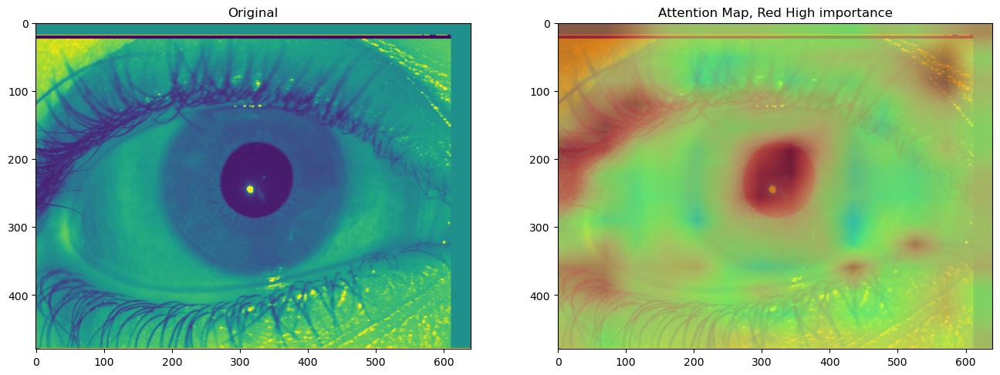

In [ ]:
image_used = random.randint(0, len(dataset_processed["test"]) - 1)

img = dataset["test"][image_used]["image"]
pixel_values = dataset_processed["test"][image_used]["pixel_values"].unsqueeze(0)  # Add batch dimension
model.eval()
with torch.no_grad():
    outputs = model(pixel_values)

att = torch.stack(outputs.attentions).squeeze(1)
# Average the attention weights across all heads.
att_mat = torch.mean(att, dim=1)

# To account for residual connections, we add an identity matrix to the
# attention matrix and re-normalize the weights.
residual_att = torch.eye(att_mat.size(1))
aug_att_mat = att_mat + residual_att
aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

# Recursively multiply the weight matrices
joint_attentions = torch.zeros(aug_att_mat.size())
joint_attentions[0] = aug_att_mat[0]

for n in range(1, aug_att_mat.size(0)):
    joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])

# Attention from the output token to the input space.
v = joint_attentions[-1]
grid_size = int(np.sqrt(aug_att_mat.size(-1)))
mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
mask = cv2.resize(mask / mask.max(), img.size)[..., np.newaxis]
result = (mask * img).astype("uint8")

#pil_img =  Image.fromarray(np.array(img))
#gray_img = gray_img.convert("L")
#gray_result =  Image.fromarray(np.array(result))
#gray_result = gray_result.convert("L")

heatmap = cm.turbo(mask.squeeze(), alpha=0.9)  # jet colormap with alpha transparency
heatmap = (heatmap[:, :, :4] * 255).astype(np.uint8)
alpha = 0.6

blended = (np.array(img) * (1 - alpha) + heatmap * alpha).astype(np.uint8)

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
ax1.set_title('Original')
ax2.set_title('Attention Map, Red High importance')
_ = ax1.imshow(img)
_ = ax2.imshow(blended)

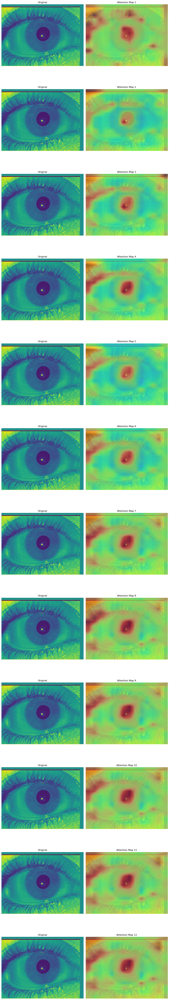

In [32]:
num_maps = len(joint_attentions)
fig, axes = plt.subplots(nrows=num_maps, ncols=2, figsize=(12, 6 * num_maps))

for i, v in enumerate(joint_attentions):
    # Attention from the output token to the input space.
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), img.size)[..., np.newaxis]
    result = (mask * img).astype("uint8")

    heatmap = cm.turbo(mask.squeeze(), alpha=0.9)  # jet colormap with alpha transparency
    heatmap = (heatmap[:, :, :4] * 255).astype(np.uint8)
    alpha = 0.6

    blended = (np.array(img) * (1 - alpha) + heatmap * alpha).astype(np.uint8)

    ax1, ax2 = axes[i]
    ax1.set_title('Original')
    ax2.set_title(f'Attention Map {i+1}')
    ax1.imshow(img)
    ax2.imshow(blended)
    ax1.axis("off")
    ax2.axis("off")
plt.tight_layout()
plt.savefig("./attention1.png")

## Loading Dataset

### Model 2 Epochs on right eye 

In [157]:

model = AutoModelForImageClassification.from_pretrained(f"{hugging_dataset}/model1")

male_total_logits_list = []
male_true_logits_list = []  #stores the score of the logits where the label male was true
female_true_logits_list = [] # same for female
labels_list = []

for entry in tqdm(dataset_processed["test"]):
    pixel_values = entry["pixel_values"].unsqueeze(0)  # Add batch dimension
    label = entry["labels"]

    with torch.no_grad():
        outputs = model(pixel_values)

    probs = F.softmax(outputs.logits, dim=1)[0]
     # select the Male probability
    male_total_logits_list.append(probs[1].item())
    # Append 0 if label is not, else append the probability
    if label == 1:
        male_true_logits_list.append(probs[1].item())  
    else:
        female_true_logits_list.append(1 - probs[0].item())  # 0 - Woman, 1 - Man
    # Append the label to the labels_list
    labels_list.append(label)

np_male2_list = np.array(male_true_logits_list)
np_female2_list = np.array(female_true_logits_list)
np_total2_list = np.array(male_total_logits_list)

100%|██████████| 300/300 [01:06<00:00,  4.48it/s]


In [13]:
np_male_list = np.load("./det_curve_report/right_eyes_only/male_scores.npy")
np_female_list = np.load("./det_curve_report/right_eyes_only/female_scores.npy") 
np_total_list =np.load("./det_curve_report/right_eyes_only/total_scores.npy") 
np_labels_list = np.load("./det_curve_report/right_eyes_only/labels_list.npy") 

In [19]:
model2_male = np.load("./det_curve_report/both_eyes/male_scores.npy")
model2_female = np.load("./det_curve_report/both_eyes/female_scores.npy")
model3_male = np.load("./det_curve_report/both_eyes_mirrored/male_scores.npy")
model3_female = np.load("./det_curve_report/both_eyes_mirrored/female_scores.npy")
model4_male = np.load("./det_curve_report/both_eyes_together/male_scores.npy")
model4_female = np.load("./det_curve_report/both_eyes_together/female_scores.npy")

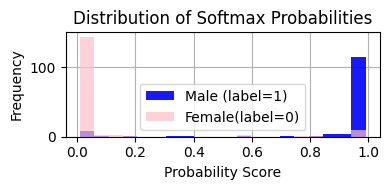

In [44]:
plt.figure(figsize=(4, 2))
bins = 20

plt.hist(np_male_list, bins=bins, alpha=0.9, label='Male (label=1)', color='blue')
plt.hist(np_female_list, bins=bins, alpha=0.7, label='Female(label=0)', color='pink')

plt.title('Distribution of Softmax Probabilities')
plt.xlabel('Probability Score')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

0.08002328601495678

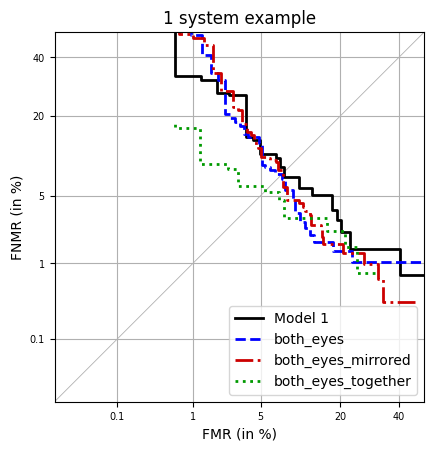

In [26]:
import importlib
from matplotlib.backends.backend_pdf import PdfPages
import src.auxiliary_utils as auxiliary_utils
from src.auxiliary_utils import Auxiliary
import importlib
import src.DET as DET

importlib.reload(auxiliary_utils)
auxiliary = Auxiliary(np_male_list ,np_female_list, np_labels_list, np_total_list, 0.5, "percent")

# Create the PDF file
#auxiliary.plot_det()
auxiliary.plot_det(model2=[model2_male, model2_female], model3=[model3_male, model3_female], model4=[model4_male, model4_female])
#auxiliary.print_classification_metrics()
